In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import itertools

DATA_PATH = 'transcriptomic_preproc'
RANDOM_STATE = 42

c:\Users\giuli\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
adata = sc.read(DATA_PATH) # data already preprocess
adata

AnnData object with n_obs × n_vars = 247976 × 2789
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [3]:
adata = adata[adata.obs['cell_type'] == 'PBMC']
adata = adata[adata.obs['MS/HC'] == 'MS']

In [4]:
adata.obs['cell_types_labels'].value_counts()

cell_types_labels
T cells                       83968
B cells                       16813
ILC                           10665
Monocytes                      2002
Plasma cells                    797
DC                              187
HSC/MPP                          81
pDC                              57
Megakaryocytes/platelets         42
Megakaryocyte precursor          19
ETP                              12
Macrophages                      10
Double-positive thymocytes        5
Cycling cells                     3
Mast cells                        2
Double-negative thymocytes        1
Epithelial cells                  1
B-cell lineage                    1
MNP                               1
Name: count, dtype: int64

In [5]:
# drop cells 'Double-negative thymocytes', 'Epithelial cells', 'B-cell lineage', 'MNP'
adata = adata[~adata.obs['cell_types_labels'].isin(['Double-negative thymocytes', 'Epithelial cells', 'B-cell lineage', 'MNP'])]

### Finding markers gene

In [6]:
sc.tl.rank_genes_groups(adata, 'cell_types_labels', method='t-test', random_state=RANDOM_STATE)

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
c:\Users\giuli\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\giuli\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\giuli\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\giuli\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\giuli\anaconda3\lib\site-packa

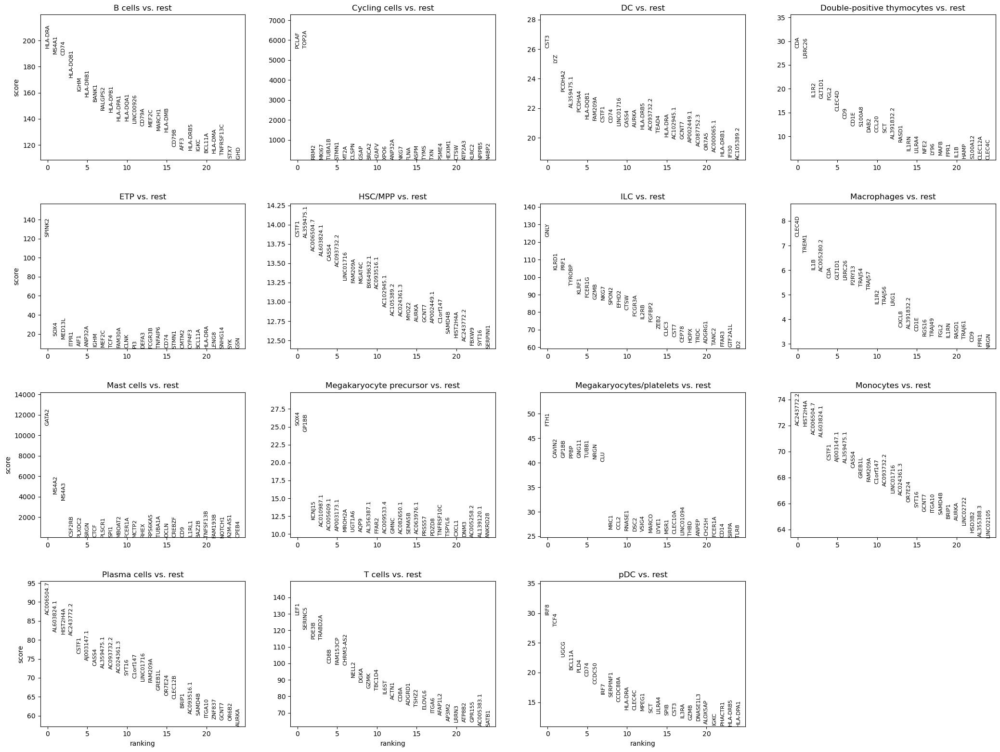

In [7]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [8]:
pd.DataFrame(adata.uns['rank_genes_groups']['names'])[:10]

,B cells,Cycling cells,DC,Double-positive thymocytes,ETP,HSC/MPP,ILC,Macrophages,Mast cells,Megakaryocyte precursor,Megakaryocytes/platelets,Monocytes,Plasma cells,T cells,pDC
0,HLA-DRA,PCLAF,CST3,CDA,SPINK2,CSTF1,GNLY,CLEC4D,GATA2,SOX4,FTH1,AC243772.2,AC006504.7,LEF1,IRF8
1,MS4A1,TOP2A,LYZ,LRRC26,SOX4,AL359475.1,KLRD1,TREM1,MS4A2,GP1BB,CAVIN2,HIST2H4A,AL603824.1,SERINC5,TCF4
2,CD74,RRM2,PCDHA2,IL1R2,MED13L,AC006504.7,PRF1,IL1B,MS4A3,KCNJ15,GP1BB,AC006504.7,HIST2H4A,PDE3B,UGCG
3,HLA-DQB1,MKI67,AL359475.1,GLT1D1,ITPR1,AL603824.1,TYROBP,AC005280.2,CSF2RB,AC010987.1,PPBP,AL603824.1,AC243772.2,TRABD2A,BCL11A
4,IGHM,TUBA1B,PCDHA4,FGL2,AIF1,CASS4,KLRF1,CDA,PLXDC2,AC005609.1,GNG11,CSTF1,CSTF1,CD8B,PLD4
5,HLA-DRB1,STMN1,HLA-DQB1,CLEC4D,ANP32A,AC093732.2,FCER1G,GLT1D1,SRGN,AP003173.1,TUBB1,AJ003147.1,AJ003147.1,FAM153CP,CD74
6,BANK1,MT2A,FAM209A,CD9,IGHM,LINC01716,GZMB,LRRC26,CTCF,MROH2A,NRGN,AL359475.1,CASS4,CHRM3-AS2,CCDC50
7,RALGPS2,CLSPN,CSTF1,CD1E,MEF2C,FAM209A,NKG7,P2RY13,PLSCR1,UGT1A6,CLU,CASS4,AL359475.1,NELL2,IRF7
8,HLA-DPB1,GSAP,CD74,S100A8,TCF4,MGAT4C,SPON2,TRAJ54,SPI1,AQP9,MRC1,GREB1L,AC093732.2,DGKA,SERPINF1
9,HLA-DPA1,BRCA2,LINC01716,DAB2,FAM30A,BX649632.1,EFHD2,TRAJ57,MBOAT2,AL356387.1,CCL2,FAM209A,AC024361.3,GZMK,CCDC88A


In [9]:
# dict with cluster number as key and the genes as values
cluster_genes = {}
for cluster in pd.DataFrame(adata.uns['rank_genes_groups']['names']).columns:
    cluster_genes[cluster] = pd.DataFrame(adata.uns['rank_genes_groups']['names'])[cluster].tolist()[:20]

In [10]:
with open('results/markers_PBMC_MS.json', 'w') as f:
    json.dump(cluster_genes, f)

### Plots

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


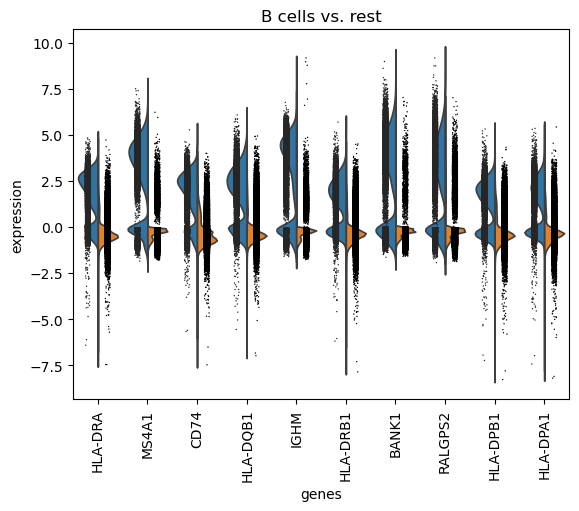

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


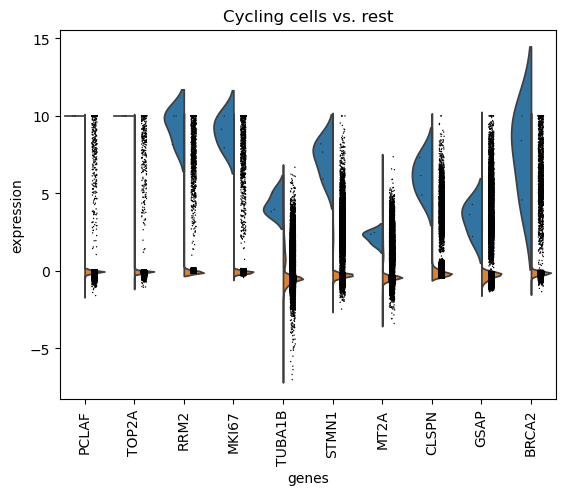

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


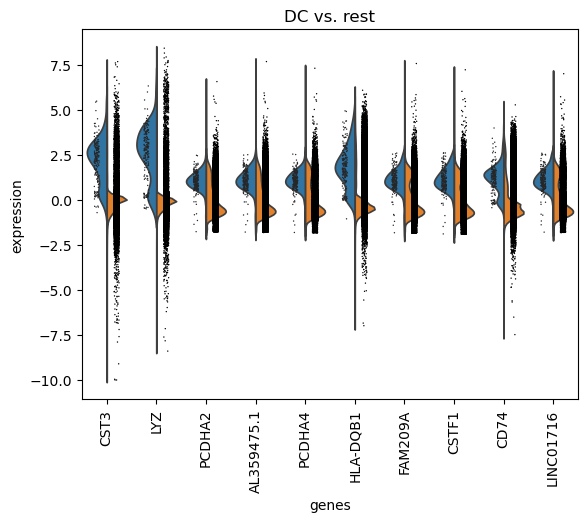

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


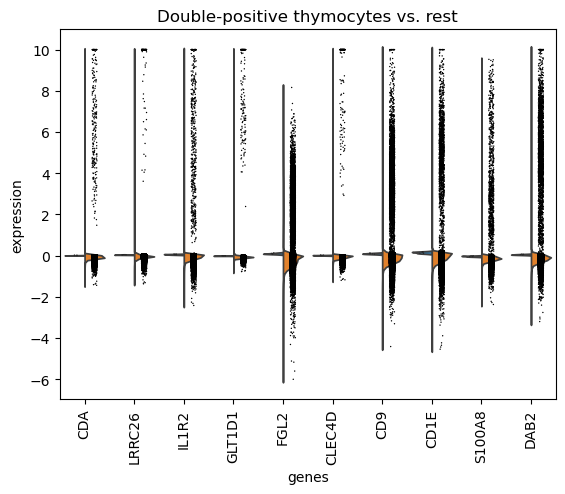

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


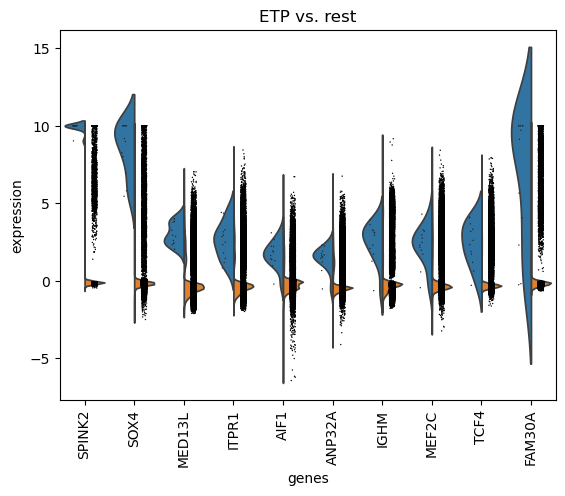

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


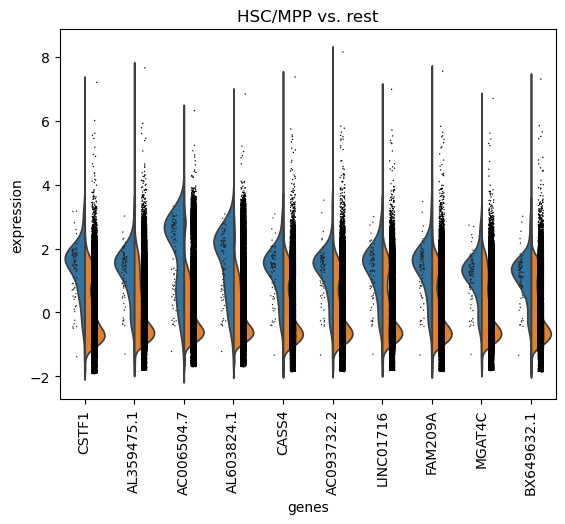

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


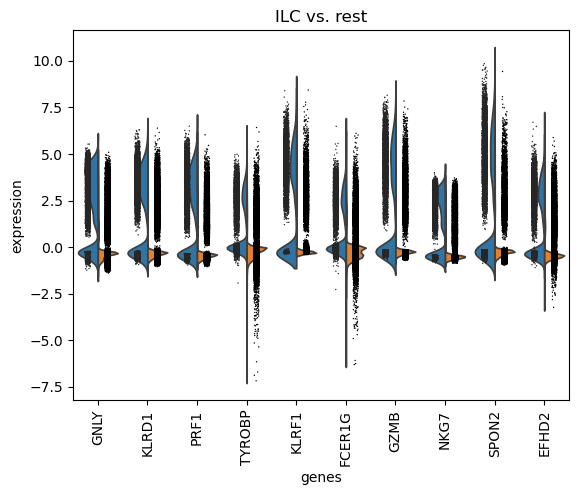

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


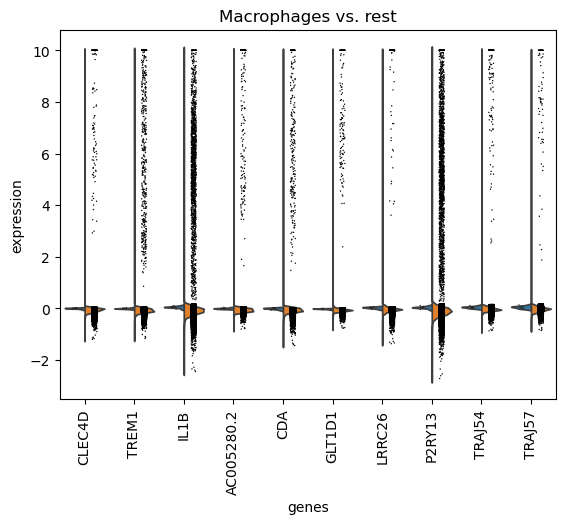

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


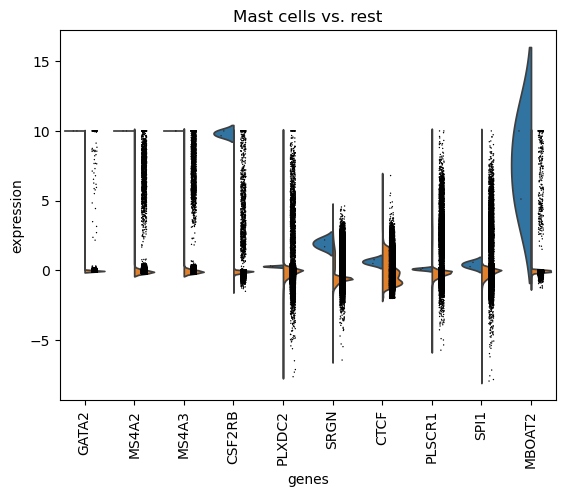

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


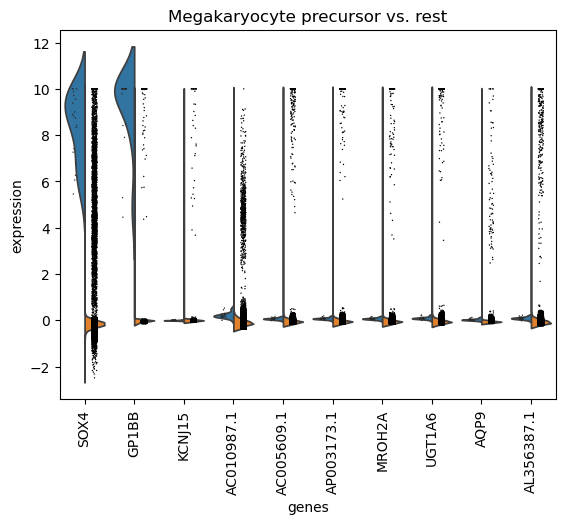

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


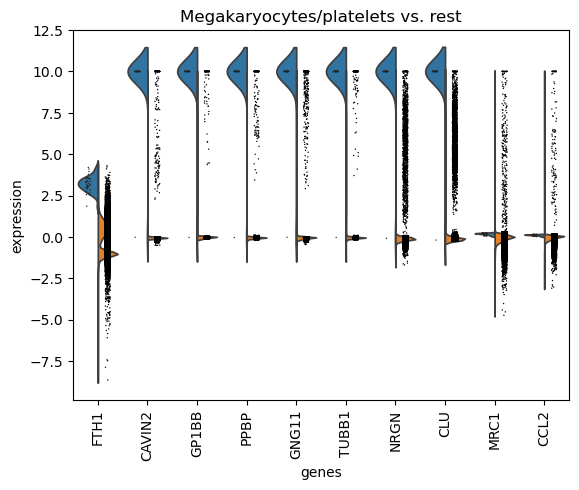

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


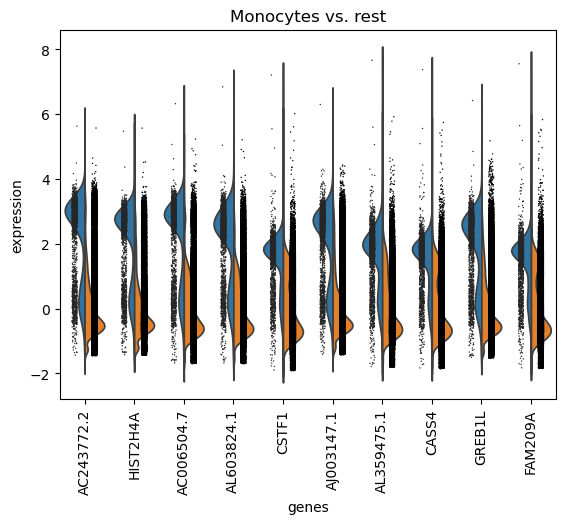

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


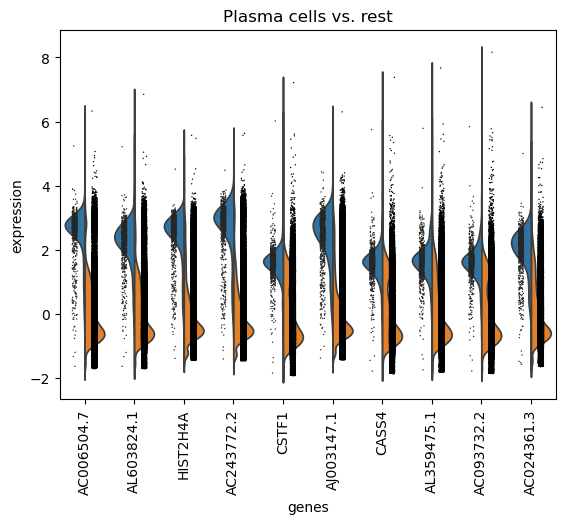

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


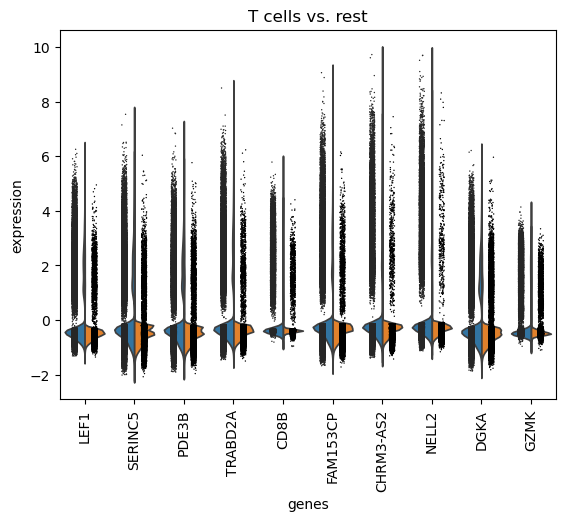

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


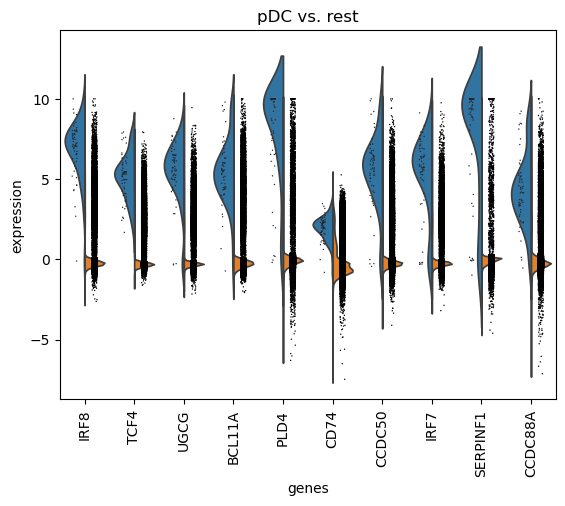

In [11]:
# visualize the clusters genes
sc.pl.rank_genes_groups_violin(adata, n_genes=10)

In [12]:
most_freq_cell_types = ['T cells', 'B cells', 'ILC', 'Monocytes', 'Plasma cells']

In [13]:
marker_genes = list(itertools.chain.from_iterable([cluster_genes[cell] for cell in most_freq_cell_types]))

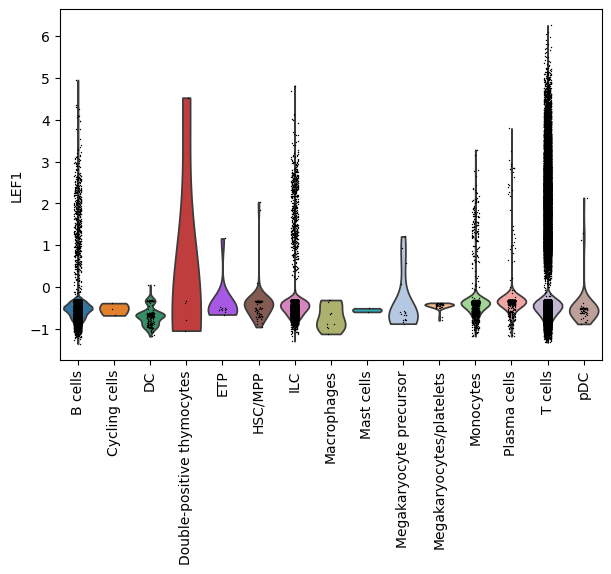

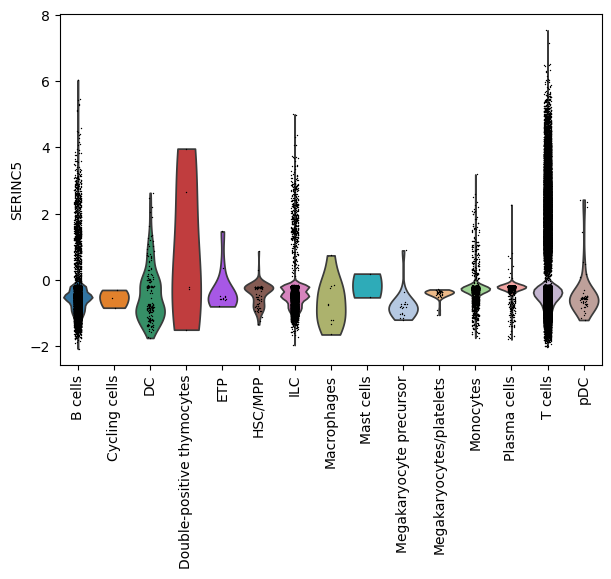

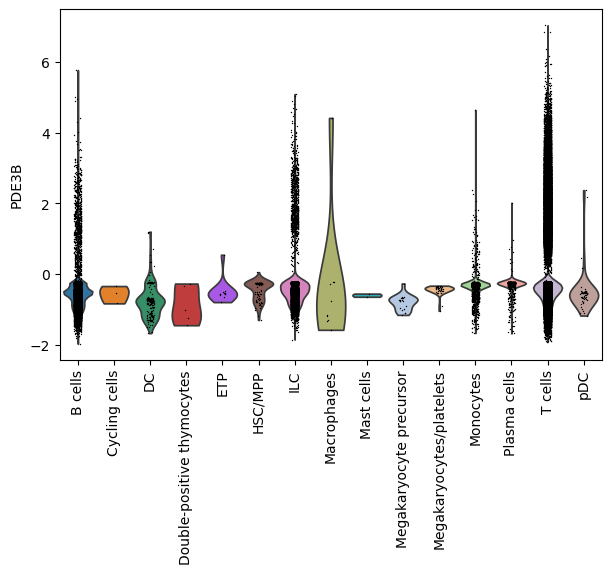

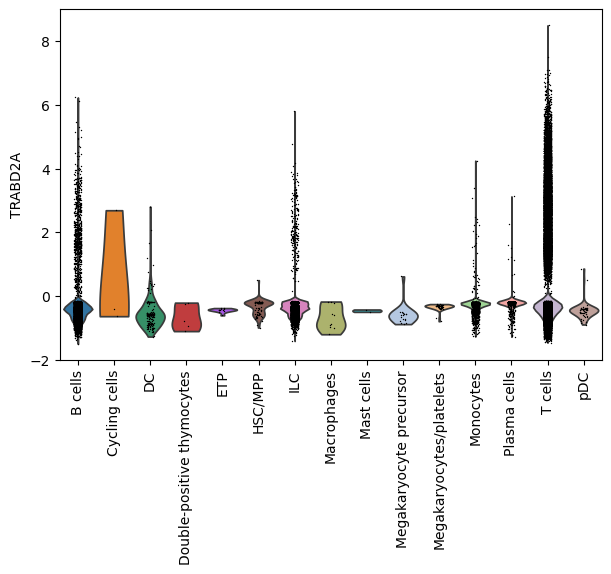

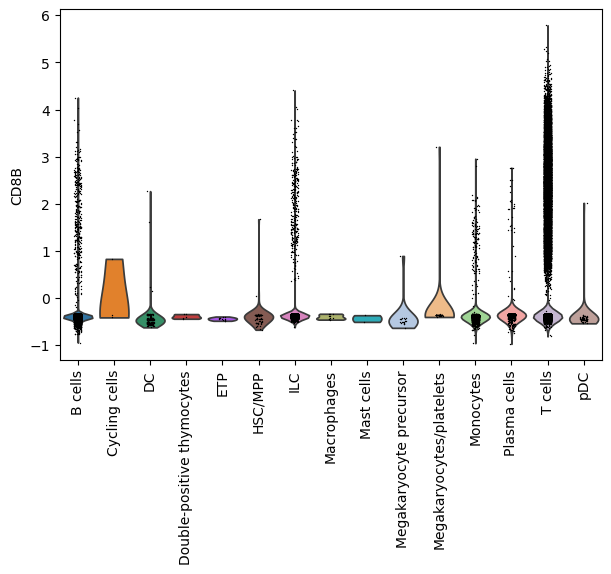

...

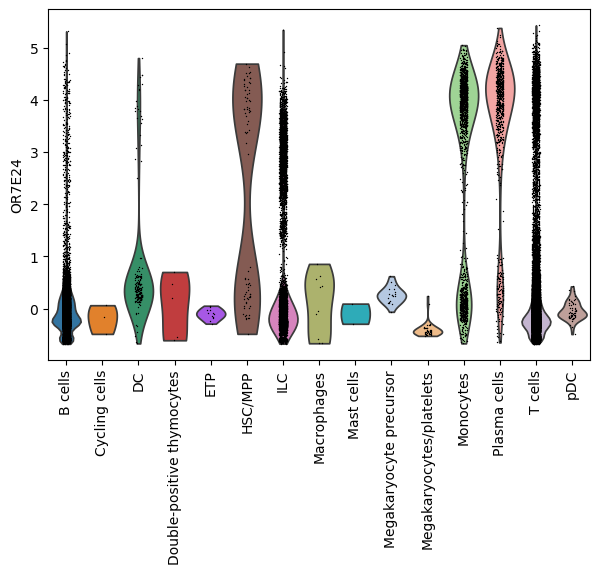

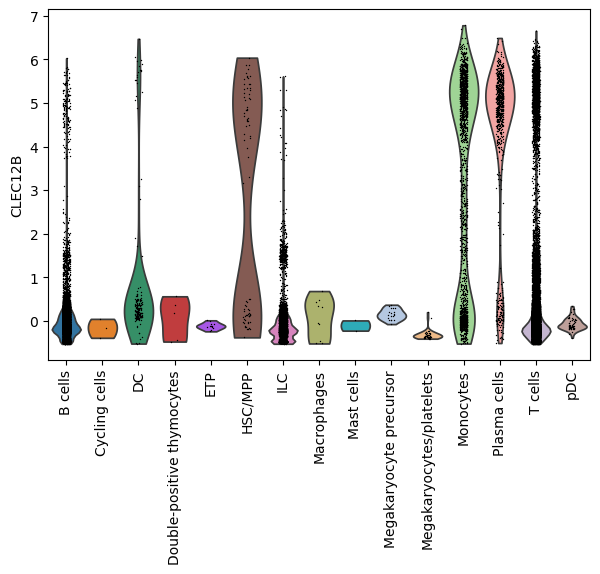

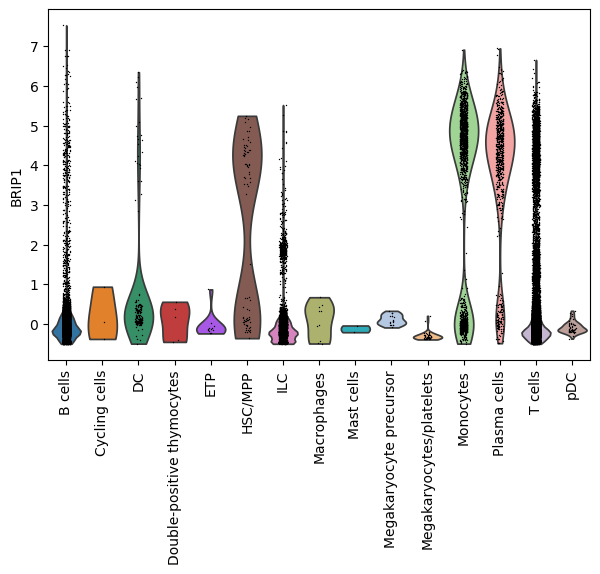

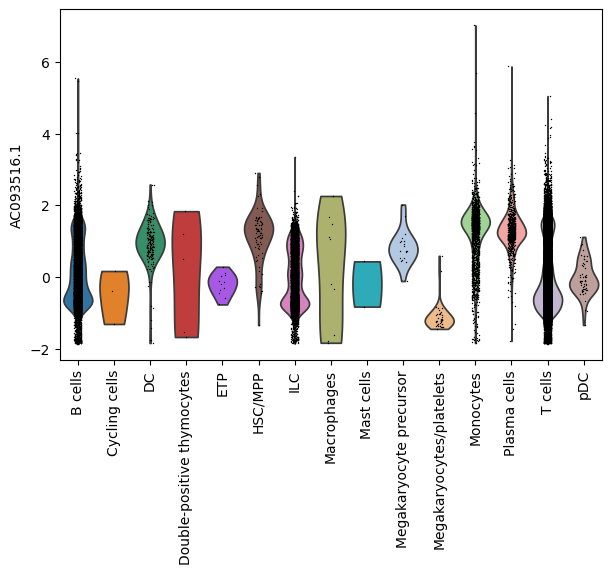

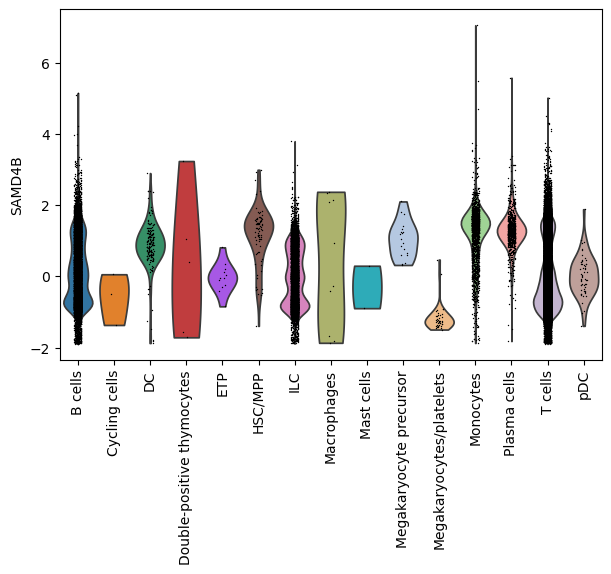

In [14]:
for gene in marker_genes:
    sc.pl.violin(adata, gene, groupby='cell_types_labels', rotation=90)

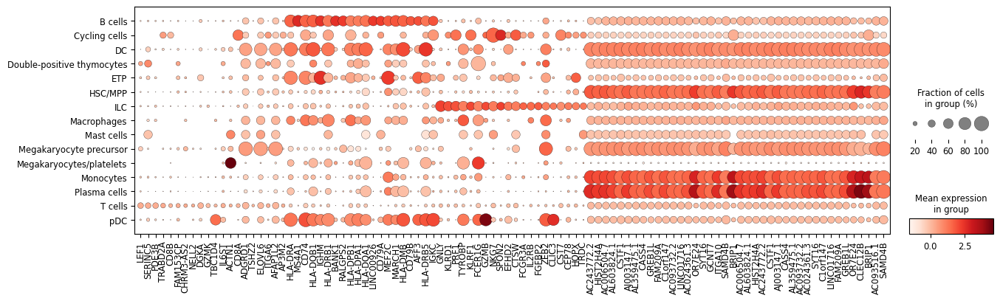

In [23]:
sc.pl.dotplot(adata, marker_genes, groupby='cell_types_labels', figsize=(15, 4), dendrogram=False);

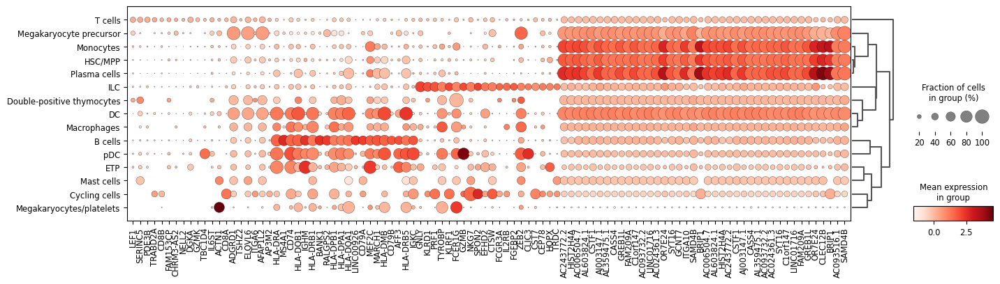

In [24]:
sc.pl.dotplot(adata, marker_genes, groupby='cell_types_labels', figsize=(16, 4), dendrogram=True);

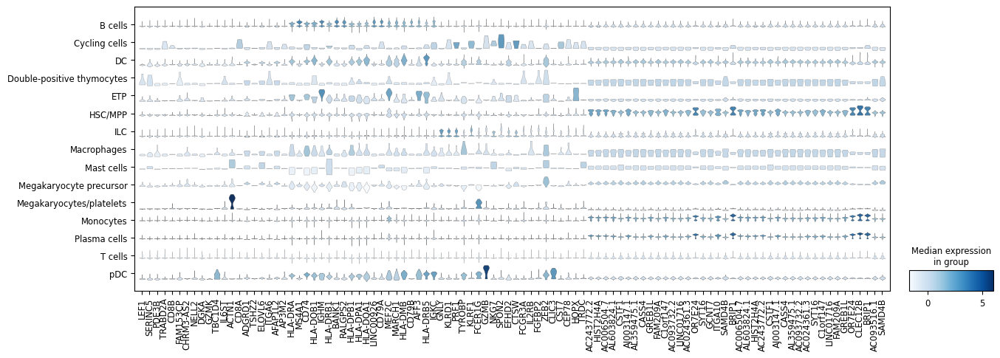

In [25]:
sc.pl.stacked_violin(adata, marker_genes, groupby='cell_types_labels', figsize=(15, 5), dendrogram=False);

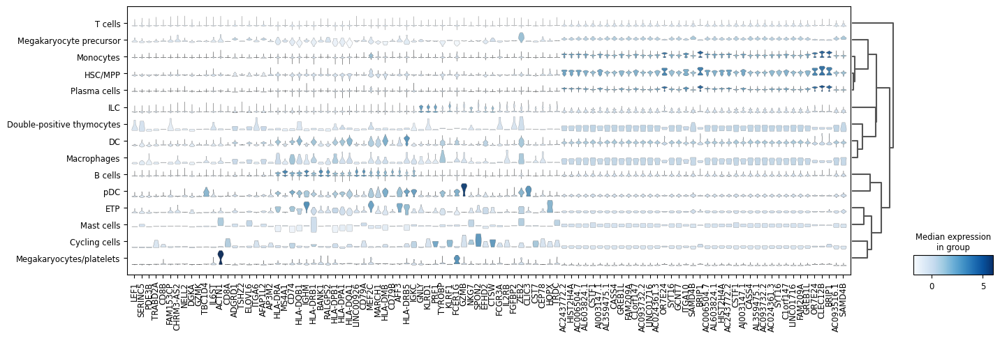

In [18]:
sc.pl.stacked_violin(adata, marker_genes, groupby='cell_types_labels', figsize=(16, 5), dendrogram=True);

In [19]:
adata_rest = adata[~adata.obs['cell_types_labels'].isin(most_freq_cell_types)]

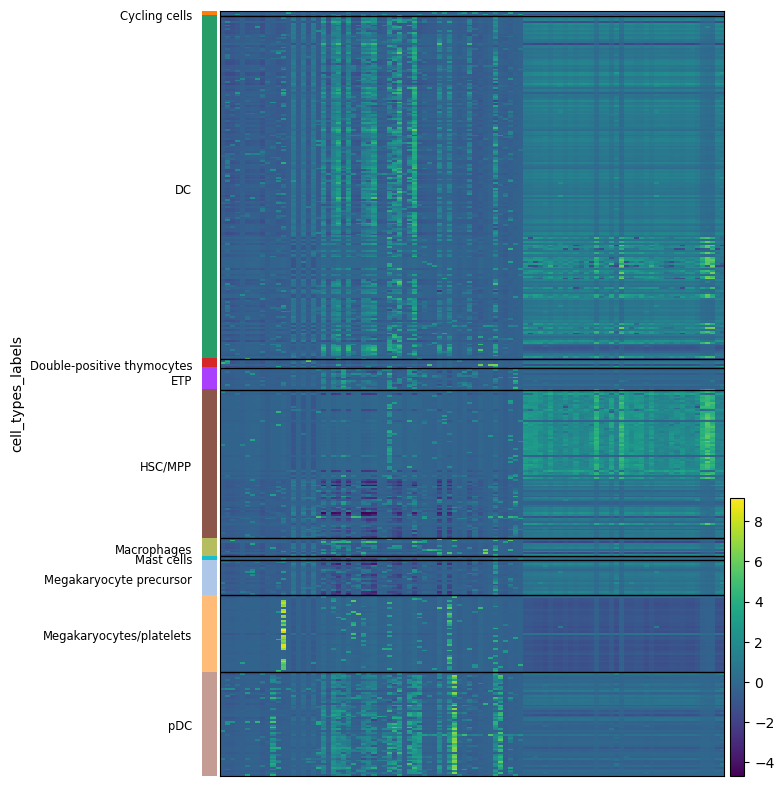

In [28]:
sc.pl.heatmap(adata_rest, marker_genes, groupby='cell_types_labels', dendrogram=False, figsize=(7, 10));

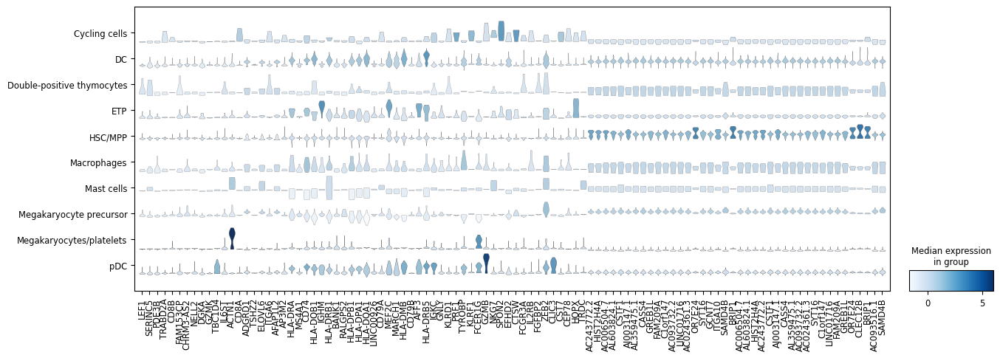

In [27]:
sc.pl.stacked_violin(adata_rest, marker_genes, groupby='cell_types_labels', figsize=(15, 5));

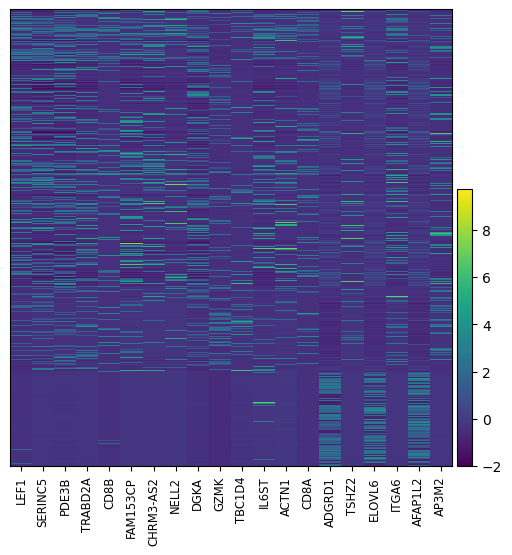

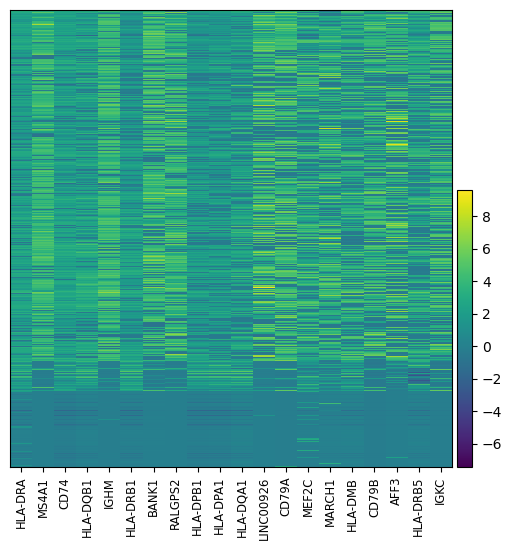

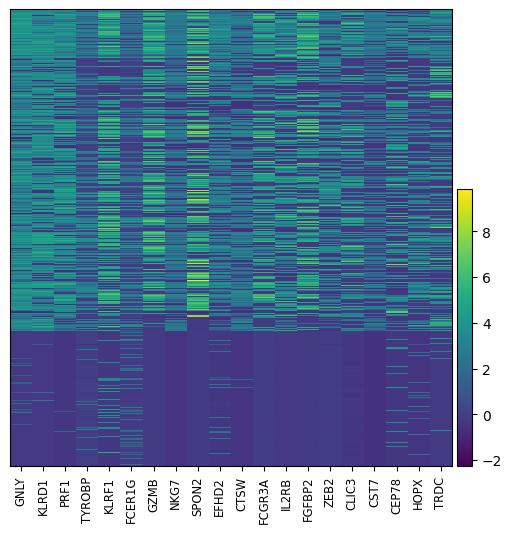

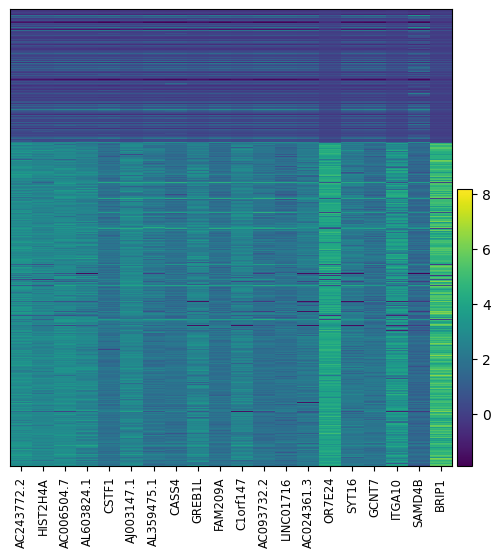

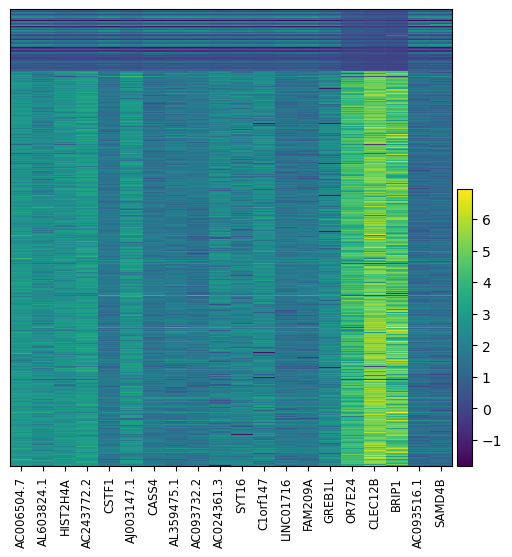

In [22]:
for cell_type in most_freq_cell_types:
    sc.pl.heatmap(adata[adata.obs['cell_types_labels'] == cell_type],
        cluster_genes[cell_type], groupby='cell_types_labels', dendrogram=False);